In [1]:
from typing import Any
import numpy as np
import torch
import torch.nn as nn
import torchvision.transforms.v2 as v2
from torchvision import datasets
from torch.utils.data.dataset import random_split

## Excercise 1 MNIST

In [2]:
transform = v2.Compose([
    v2.ToImage(), 
    v2.ToDtype(torch.float32, scale=True),
    torch.flatten
])

mnist_train = datasets.MNIST(root="./data", train=True, download=True, transform=transform)
mnist_test  = datasets.MNIST(root="./data", train=False, download=True, transform=transform)
mnist_train, mnist_val = random_split(mnist_train, [0.75, 0.25])

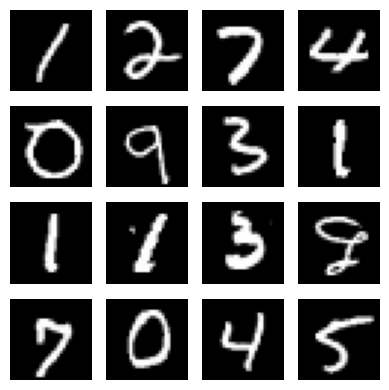

In [3]:
import matplotlib.pyplot as plt
from itertools import islice
from operator import itemgetter

def draw_sample_images(digits: list[np.ndarray], rows: int, cols: int):
    fig, axes = plt.subplots(rows, cols, figsize=(4, 4))

    for i, ax in enumerate(axes.flat):
        ax.imshow(digits[i].reshape(28, 28), cmap="gray")
        ax.axis("off")

    plt.tight_layout()
    plt.show()

sample_images = list(map(lambda x: x.numpy(), map(itemgetter(0), (islice(mnist_train, 16)))))
draw_sample_images(sample_images[:16], 4, 4)

Neural network architecture

In [4]:
from collections import OrderedDict

class Network(nn.Module):

    def __init__(self, dropout: float = 0.5):
        super().__init__()

        self.dropout = dropout
        self.model = nn.Sequential(OrderedDict([
            ('linear1', nn.Linear(784, 256)),
            ('relu1', nn.ReLU()),
            ('dropout1', nn.Dropout(0.5)),
            ('linear2', nn.Linear(256, 64)),
            ('relu2', nn.ReLU()),
            ('dropout2', nn.Dropout(0.5)),
            ('linear3', nn.Linear(64, 10)),
        ]))
 
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.model(x)

    @torch.no_grad
    def retrieve_hidden_states(self, x, target_name: str) -> torch.Tensor:
        self.eval()
        if target_name == "input_layer":
            return x
        for layer_name, layer in self.model.named_children():
            x = layer(x)
            if layer_name == target_name:
                return x
        
        raise ValueError(f"Model does not have a layer named: {layer_name}")

Training

In [5]:
from torch.utils.data import DataLoader
import torch.optim as optim
from copy import deepcopy
from typing import Callable


def evaluate_model(
        model: nn.Module,
        loader: DataLoader,
        loss_fn: Callable
    ) -> tuple[float, float]:

    total_loss = 0.0
    correct = 0
    total_images = 0
    number_of_batches = 0

    model = model.eval()
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images, labels
            outputs = model(images)
            
            batch_loss = loss_fn(outputs, labels)
            total_loss += batch_loss.item()

            correct += (outputs.argmax(axis=1) == labels).sum()
            total_images += outputs.shape[0]

            number_of_batches += 1

    average_loss = total_loss / number_of_batches
    accuracy = correct / total_images

    return average_loss, accuracy


def plot_training_stats(train_loss: list[float], val_loss: list[float]) -> None:
    epochs = len(train_loss)
    plt.xticks(range(0, epochs, 3))

    plt.plot(train_loss, color='red', label="Training loss")
    plt.plot(val_loss, color='blue', label="Validation loss")

    plt.xlabel("Epoch number")
    plt.ylabel("Average batch loss")

    plt.legend()
    plt.show()
    

def train_model(
        model: nn.Module, 
        train_loader: DataLoader, 
        val_loader: DataLoader,
    ) -> Network:

    optimizer = optim.AdamW(model.parameters())
    criterion = nn.CrossEntropyLoss()

    best_model, best_loss = model, float("inf")
    steps_without_improvement = 0
    train_losses, val_losses = [], []

    for epoch in range(20):
        epoch_loss = 0.0
        number_of_batches = 0
        model.train()

        for inputs, labels in train_loader:
            inputs, labels = inputs, labels
            
            outputs = model(inputs)
            batch_loss = criterion(outputs, labels)
            batch_loss.backward()

            optimizer.step()
            optimizer.zero_grad()
        
            epoch_loss += batch_loss.item()
            number_of_batches += 1
        
        train_loss = epoch_loss / number_of_batches
        train_losses.append(train_loss)

        val_loss, val_accuracy = evaluate_model(model, val_loader, criterion)
        val_losses.append(val_loss)

        if epoch % 4 == 0:
            print(f"Epoch {epoch}")
            print(f"Train average loss: {train_loss:.3f}, Validation average loss: {val_loss:.3f}")
            print(f"Validation accuracy: {100*val_accuracy:.2f}%\n")

        if val_loss < best_loss:
            steps_without_improvement = 0
            best_loss = val_loss
            best_model = deepcopy(model)
        else:
            steps_without_improvement += 1
            if steps_without_improvement > 2:
                print("Early stopping")
                break 

    plot_training_stats(train_losses, val_losses)
    return best_model

Epoch 0
Train average loss: 0.675, Validation average loss: 0.243
Validation accuracy: 93.01%

Epoch 4
Train average loss: 0.191, Validation average loss: 0.119
Validation accuracy: 96.48%

Epoch 8
Train average loss: 0.140, Validation average loss: 0.090
Validation accuracy: 97.40%

Epoch 12
Train average loss: 0.119, Validation average loss: 0.088
Validation accuracy: 97.46%

Epoch 16
Train average loss: 0.101, Validation average loss: 0.081
Validation accuracy: 97.72%



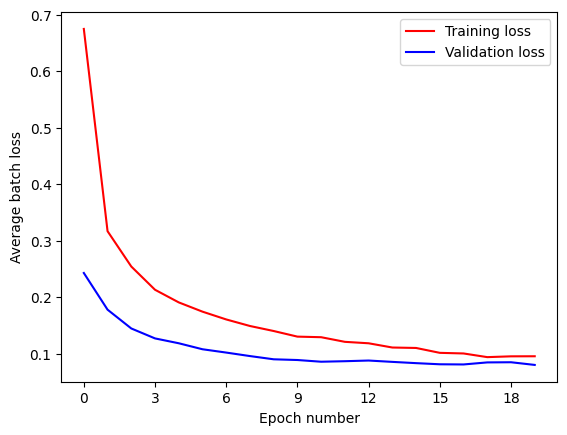

In [6]:
net = Network()
train_loader = DataLoader(mnist_train, batch_size=128)
val_loader = DataLoader(mnist_val, batch_size=128)
net = train_model(net, train_loader, val_loader)

In [7]:
def retrieve_layer_outputs(model: Network, loader: DataLoader, layer_name: str) -> tuple[torch.Tensor, torch.Tensor]:
    all_hidden_states = []
    all_labels = []

    for batch, labels in loader:
        batch_hidden_states = model.retrieve_hidden_states(batch, layer_name)
        all_hidden_states.append(batch_hidden_states)
        all_labels.append(labels)

    return torch.concat(all_hidden_states), torch.concat(all_labels)

In [8]:
test_loader = DataLoader(mnist_test, batch_size=128)

train_input, train_labels = retrieve_layer_outputs(net, train_loader, "input_layer")
test_input, test_labels = retrieve_layer_outputs(net, test_loader, "input_layer")

train_hidden1, _ = retrieve_layer_outputs(net, train_loader, "linear1")
test_hidden1, _  = retrieve_layer_outputs(net, test_loader, "linear1")

train_hidden2, _ = retrieve_layer_outputs(net, train_loader, "linear2")
test_hidden2, _  = retrieve_layer_outputs(net, test_loader, "linear2")

train_hidden3, _ = retrieve_layer_outputs(net, train_loader, "linear3")
test_hidden3, _  = retrieve_layer_outputs(net, test_loader, "linear3")

In [9]:
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
from trimap import TRIMAP
from pacmap import PaCMAP
from sklearn.neighbors import KNeighborsClassifier

def get_embedding_class(algorithm: str, **alg_kw) -> Any:
    match algorithm:
        case "tsne":
            embedding = TSNE(n_components=2, **alg_kw)
        case "umap":
            embedding = UMAP(n_components=2, **alg_kw)
        case "trimap":
            embedding = TRIMAP(n_dims=2, **alg_kw)
        case "pacmap":
            embedding = PaCMAP(n_components=2, **alg_kw)
        case _:
            embedding = PCA(n_components=2)

    return embedding

def plot_2d_points(transformed: np.ndarray, labels: np.ndarray, **param):
    
    df = pd.DataFrame({
        'x': transformed[:, 0],
        'y': transformed[:, 1],
        'label': labels
    })

    unique_labels = np.unique(labels)
    base_palette = sns.color_palette("tab10", n_colors=10)
    label_to_color = {label: base_palette[i] for i, label in enumerate(unique_labels)}

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=df, x='x', y='y', hue='label', edgecolor='k', palette=label_to_color, s=40)
    plt.legend(title='Label')

    plt.title(str(param))
    plt.show()

def train_knn(data_points: np.ndarray, labels: np.ndarray, n_neihgbors: int) -> Any:
    knn = KNeighborsClassifier(n_neighbors=n_neihgbors)
    knn.fit(data_points, labels)
    return knn


def plot_and_evaluate_embedding(
    train_data: np.ndarray,
    train_labels: np.ndarray,
    test_data: np.ndarray,
    test_labels: np.ndarray,
    embedding_algorithm: str,
    n_neighbors_list: list[int]
) -> None:
    
    embedding_algo = get_embedding_class(algorithm=embedding_algorithm)
    train_embedded = embedding_algo.fit_transform(train_data)
    plot_2d_points(train_embedded, train_labels, embedding_algorithm=embedding_algorithm, dataset="train")

    if embedding_algorithm != "umap":
        embedding_algo = get_embedding_class(algorithm=embedding_algorithm)
        test_embedded = embedding_algo.fit_transform(test_data)
        plot_2d_points(test_embedded, test_labels, embedding_algorithm=embedding_algorithm, dataset="test")
        return
    else:
        test_embedded = embedding_algo.transform(test_data)
        plot_2d_points(test_embedded, test_labels, embedding_algorithm=embedding_algorithm, dataset="test")


    for n_neighbors in n_neighbors_list:
        print(f"KNN with {n_neighbors} nearest neighbors")
        knn = train_knn(train_embedded, train_labels, n_neighbors)
        test_classified = knn.predict(test_embedded)

        accuracy = (test_classified == test_labels).sum() / test_labels.shape[0]
        print(f"Accuracy: {100*accuracy:.2f}%\n")

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


### Raw data embeddings visualisation

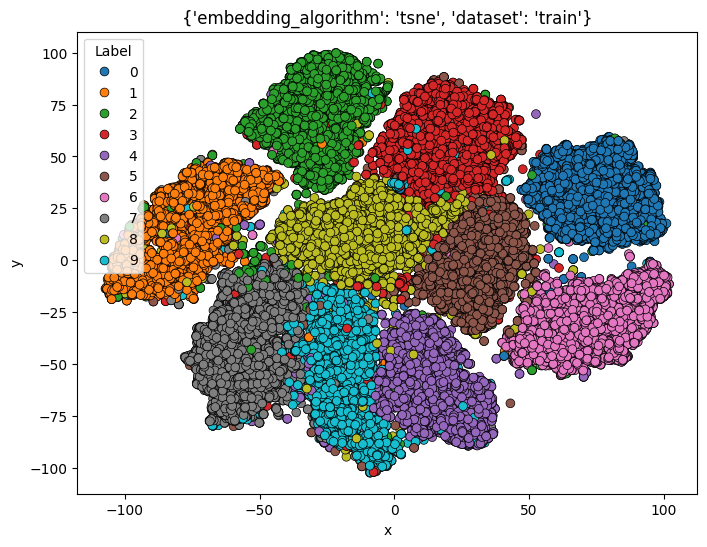

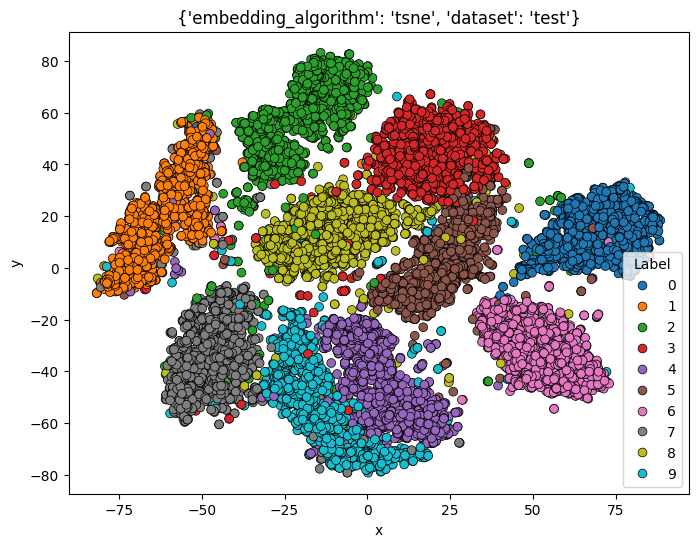

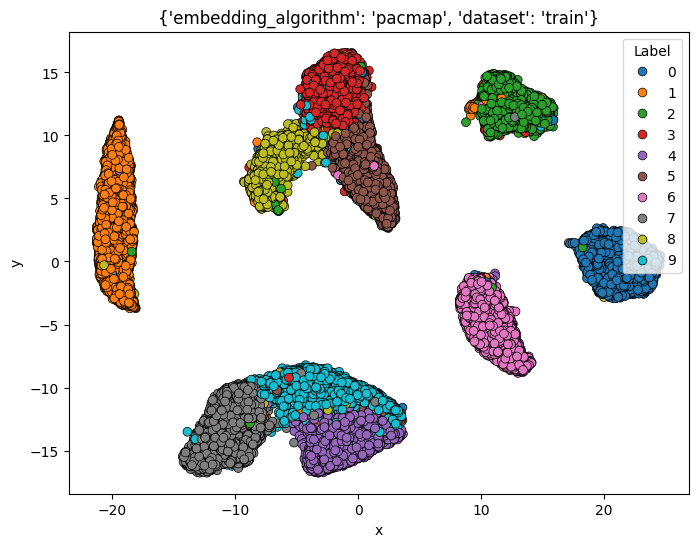

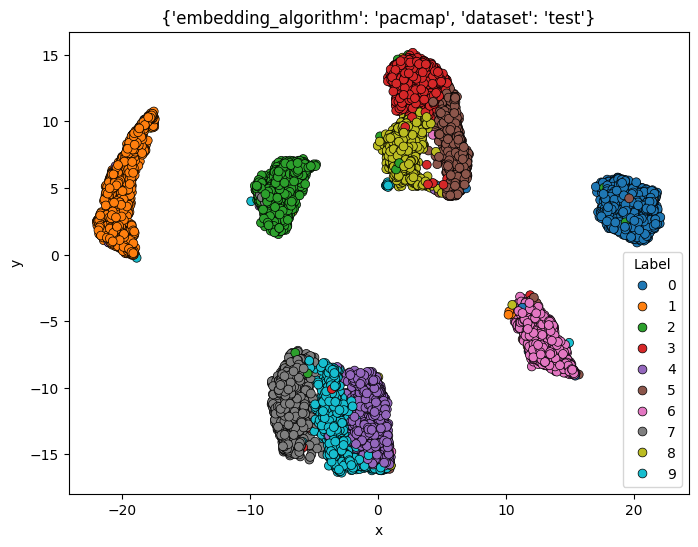

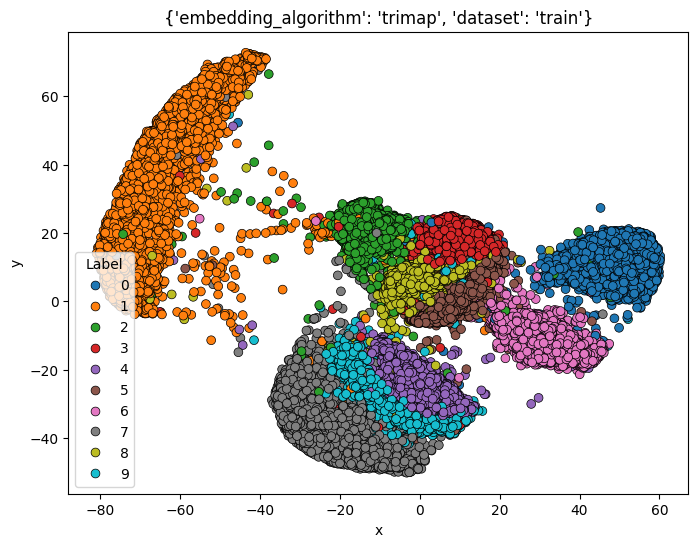

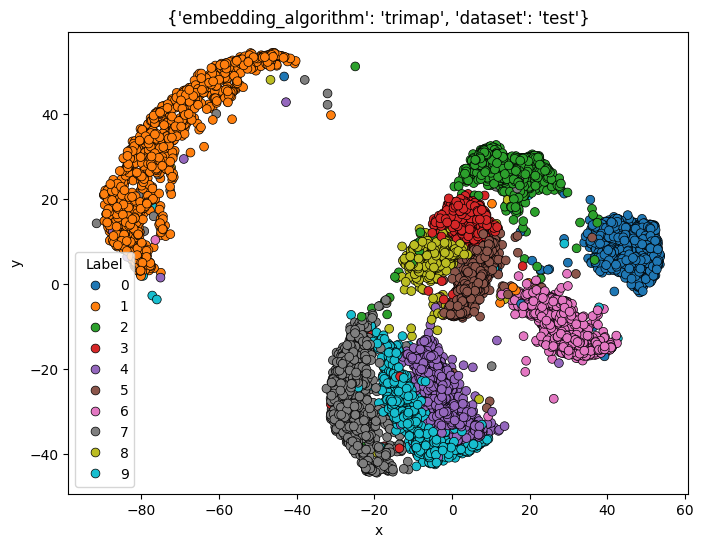

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


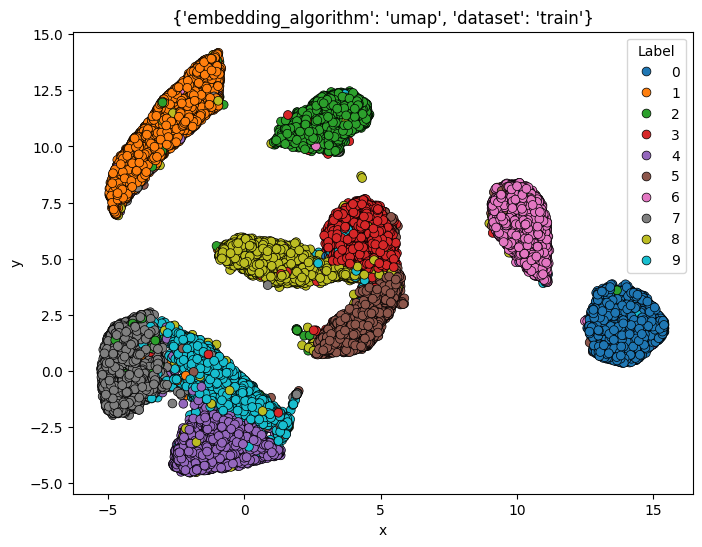

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


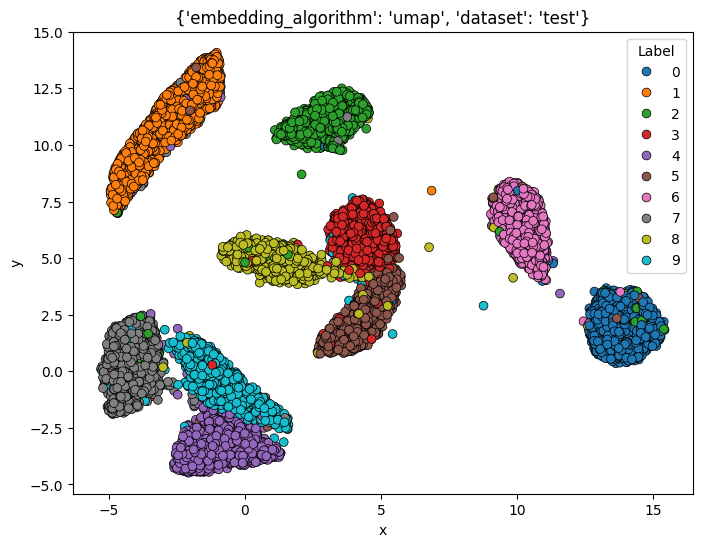

KNN with 3 nearest neighbors
Accuracy: 95.06%

KNN with 5 nearest neighbors
Accuracy: 95.18%

KNN with 10 nearest neighbors
Accuracy: 95.37%



In [10]:
embeddings_algorithms = ["tsne", "pacmap", "trimap", "umap"]

for embedding_algorithm in embeddings_algorithms:
    plot_and_evaluate_embedding(
        train_input.numpy(), 
        train_labels.numpy(), 
        test_input.numpy(), 
        test_labels.numpy(), 
        embedding_algorithm,
        [3, 5, 10]
    )

### First hidden layer visualisations and classification

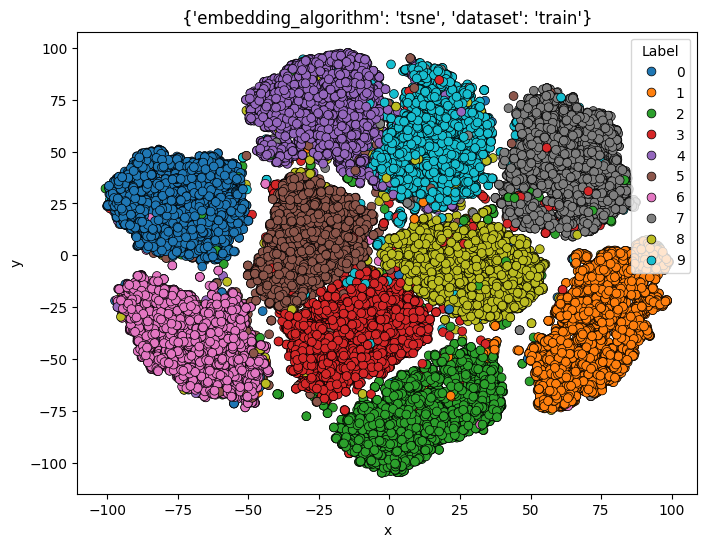

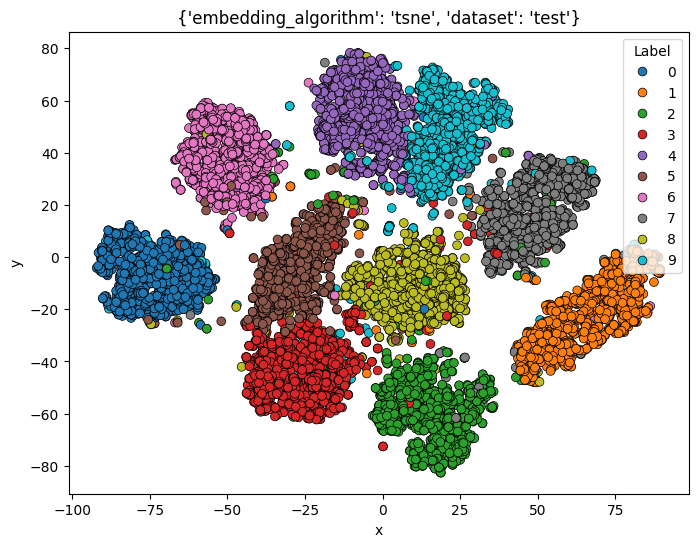

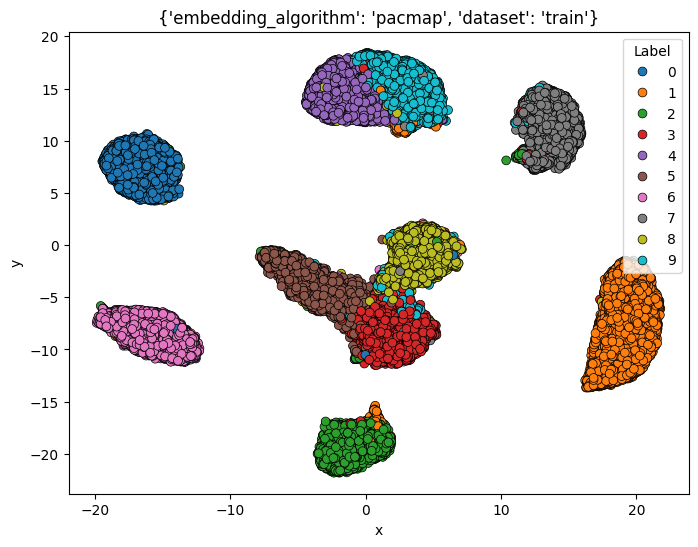

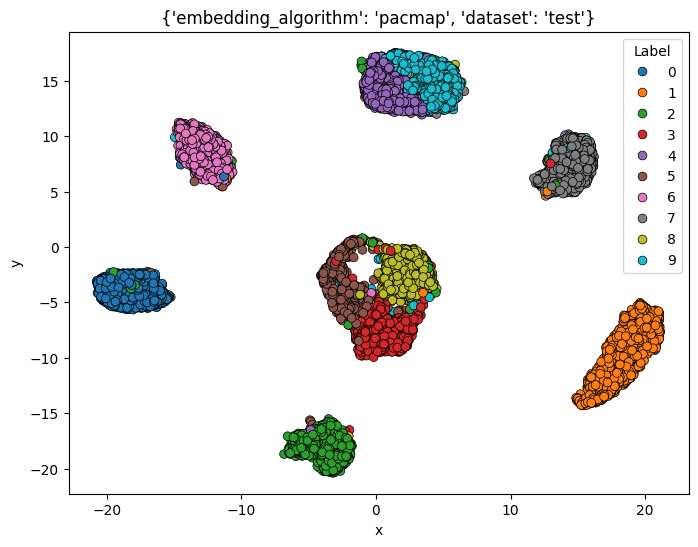

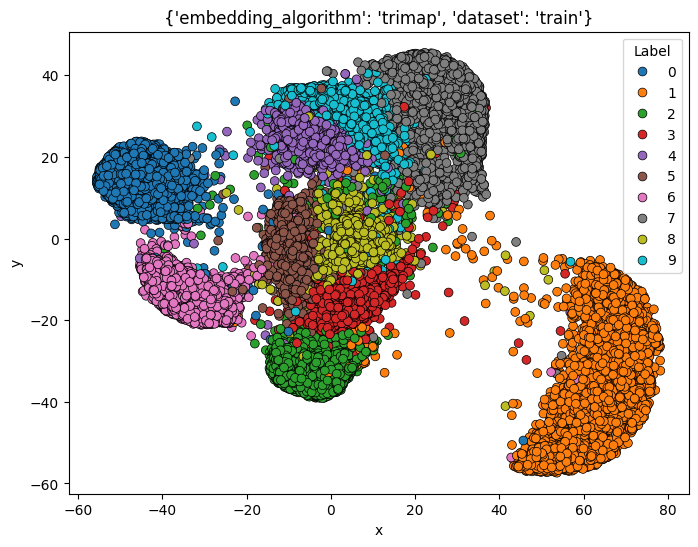

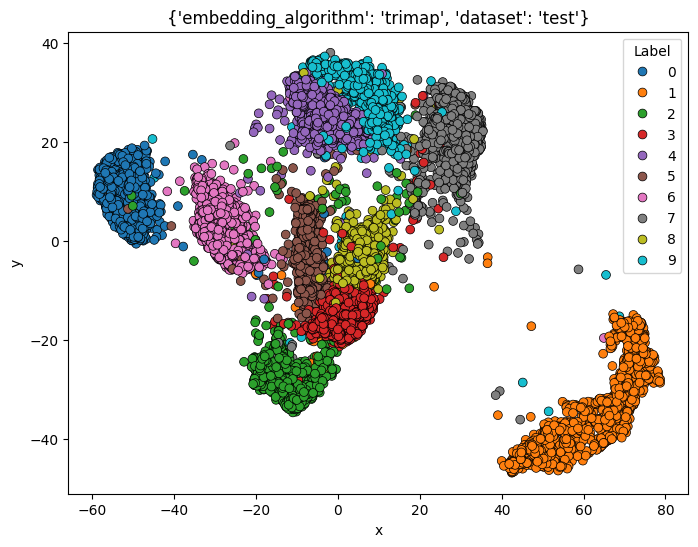

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


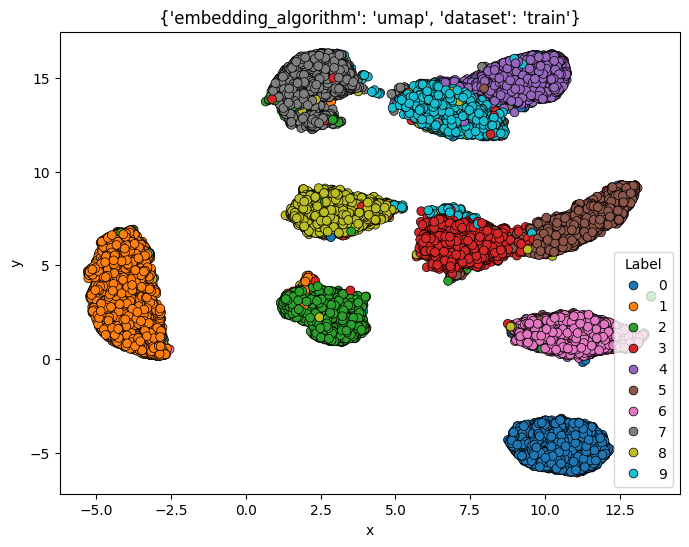

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


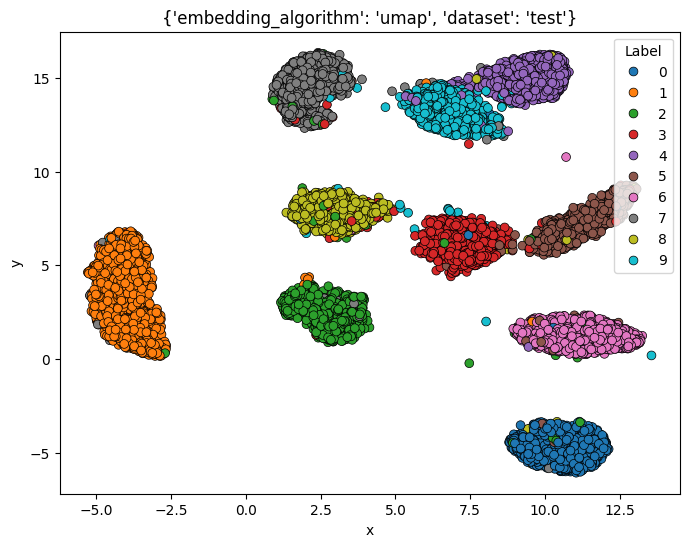

KNN with 3 nearest neighbors
Accuracy: 95.92%

KNN with 5 nearest neighbors
Accuracy: 96.15%

KNN with 10 nearest neighbors
Accuracy: 96.24%



In [11]:
for embedding_algorithm in embeddings_algorithms:
    plot_and_evaluate_embedding(
        train_hidden1.numpy(), 
        train_labels.numpy(), 
        test_hidden1.numpy(), 
        test_labels.numpy(), 
        embedding_algorithm,
        [3, 5, 10]
    )

### Second hidden layer visualisation and classification

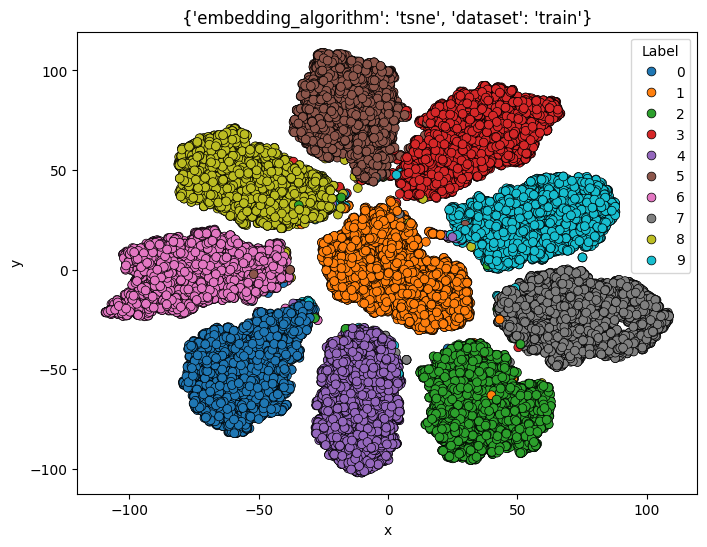

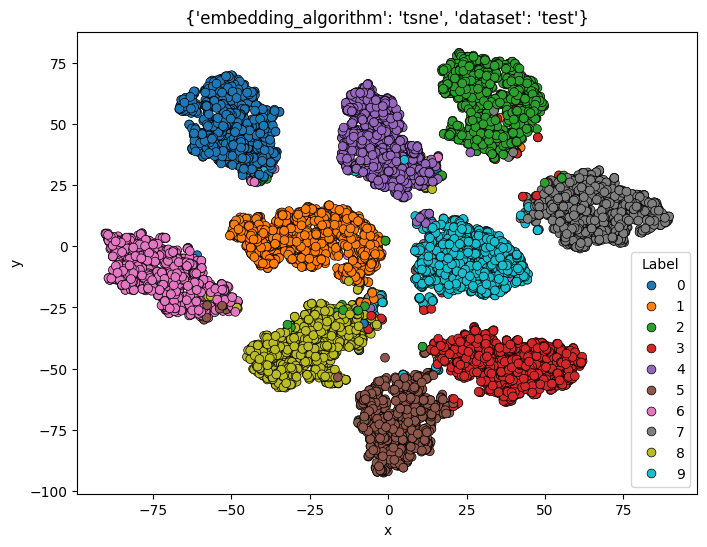

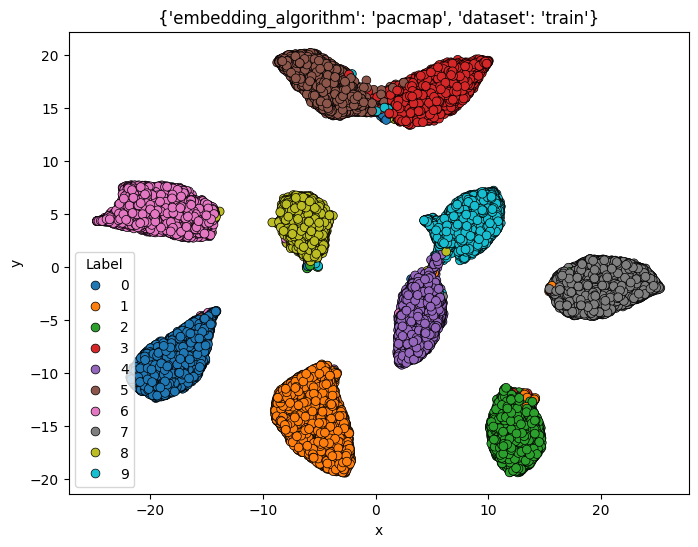

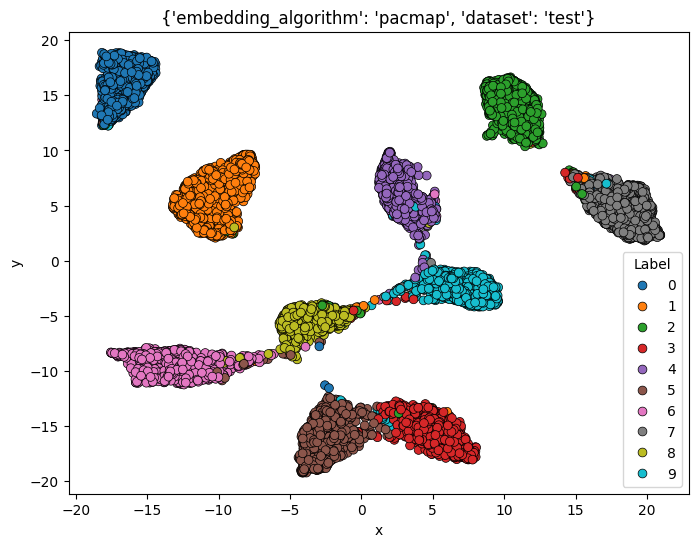

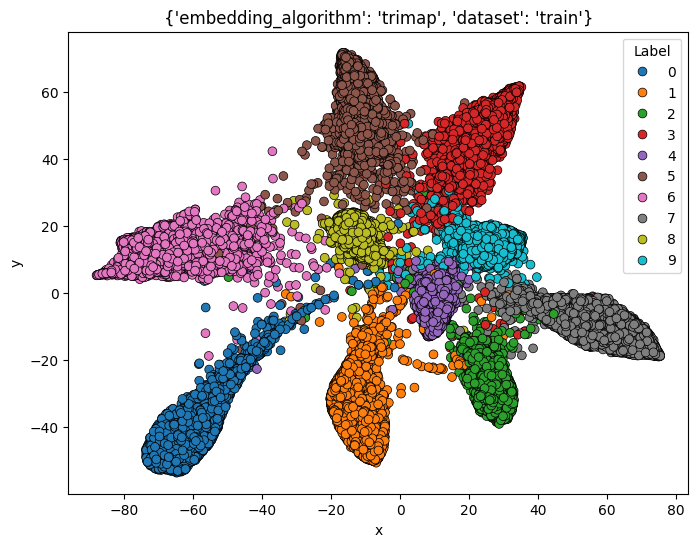

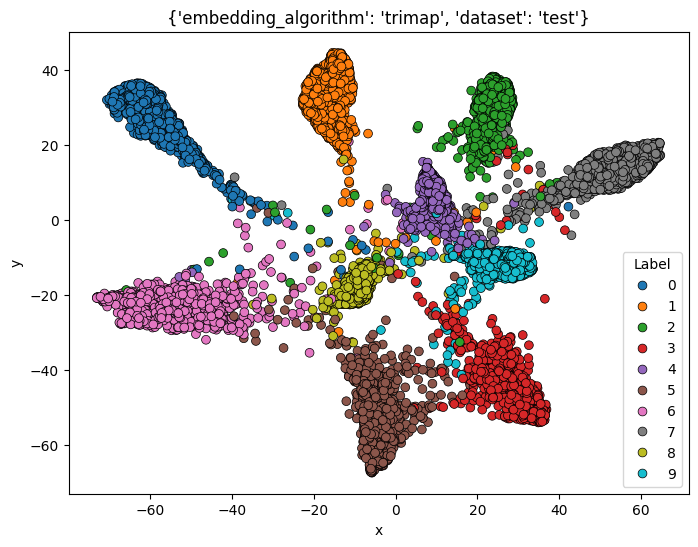

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


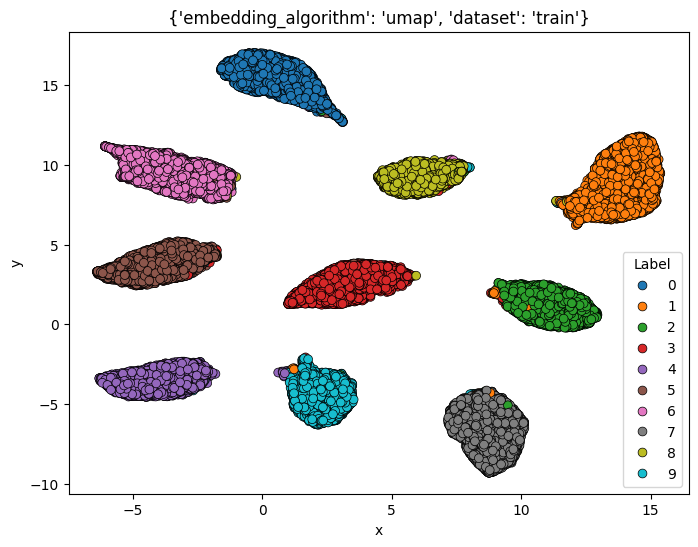

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


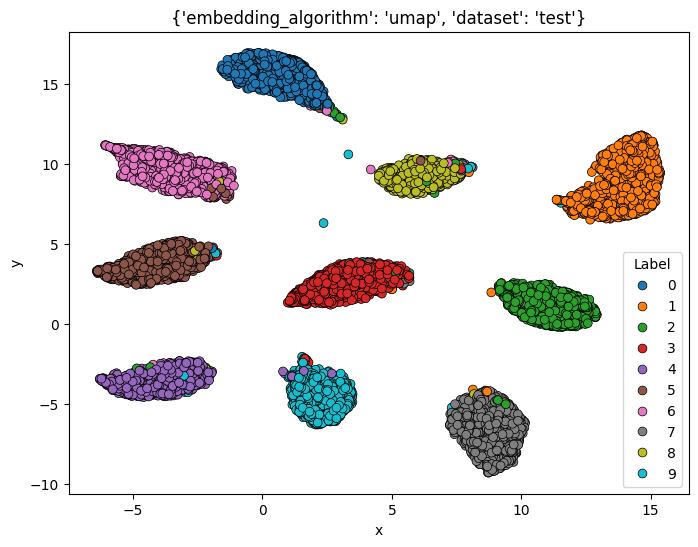

KNN with 3 nearest neighbors
Accuracy: 97.46%

KNN with 5 nearest neighbors
Accuracy: 97.56%

KNN with 10 nearest neighbors
Accuracy: 97.62%



In [12]:
for embedding_algorithm in embeddings_algorithms:
    plot_and_evaluate_embedding(
        train_hidden2.numpy(), 
        train_labels.numpy(), 
        test_hidden2.numpy(), 
        test_labels.numpy(), 
        embedding_algorithm,
        [3, 5, 10]
    )


The second hidden layer activations demonstrate even clearer class separation than the first hidden layer.
KNN classification accuracy improves when using hidden layer activations instead of raw data embeddings.
Embeddings from later layers (especially the second hidden layer) typically yield the highest accuracy, reflecting the better feature organization learned deeper in the network.

## Excercise 2 FMNIST

In [23]:

transform = v2.Compose([
    v2.ToImage(), 
    v2.ToDtype(torch.float32, scale=True),
    torch.flatten
])

fmnist_train = datasets.FashionMNIST(root="./data", train=True, download=True, transform=transform)
fmnist_test  = datasets.FashionMNIST(root="./data", train=False, download=True, transform=transform)
fmnist_train, fmnist_val = random_split(fmnist_train, [0.75, 0.25])

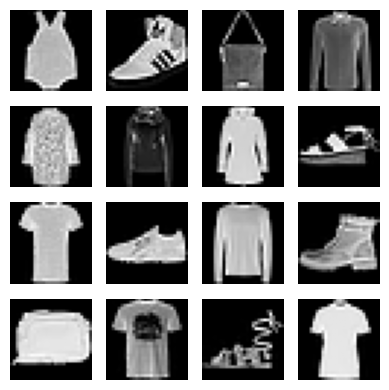

In [24]:
sample_images = list(map(lambda x: x.numpy(), map(itemgetter(0), (islice(fmnist_train, 16)))))
draw_sample_images(sample_images[:16], 4, 4)

Epoch 0
Train average loss: 0.885, Validation average loss: 0.494
Validation accuracy: 82.43%

Epoch 4
Train average loss: 0.451, Validation average loss: 0.373
Validation accuracy: 86.22%

Epoch 8
Train average loss: 0.406, Validation average loss: 0.348
Validation accuracy: 87.31%

Epoch 12
Train average loss: 0.380, Validation average loss: 0.334
Validation accuracy: 87.99%

Epoch 16
Train average loss: 0.362, Validation average loss: 0.322
Validation accuracy: 88.36%

Early stopping


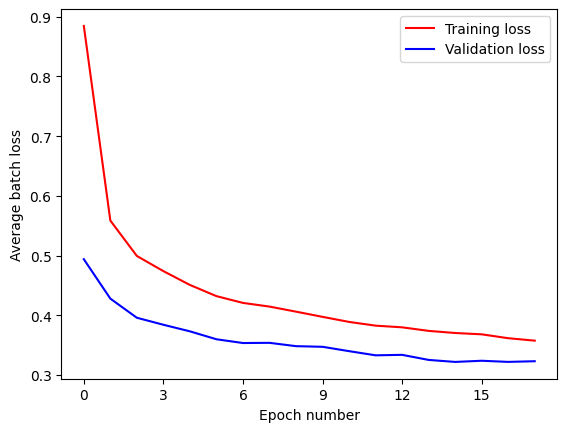

In [25]:
net = Network()
train_loader = DataLoader(fmnist_train, batch_size=128)
val_loader = DataLoader(fmnist_val, batch_size=128)
net = train_model(net, train_loader, val_loader)

In [26]:
test_loader = DataLoader(fmnist_test, batch_size=128)

train_input, train_labels = retrieve_layer_outputs(net, train_loader, "input_layer")
test_input, test_labels = retrieve_layer_outputs(net, test_loader, "input_layer")

train_hidden1, _ = retrieve_layer_outputs(net, train_loader, "linear1")
test_hidden1, _  = retrieve_layer_outputs(net, test_loader, "linear1")

train_hidden2, _ = retrieve_layer_outputs(net, train_loader, "linear2")
test_hidden2, _  = retrieve_layer_outputs(net, test_loader, "linear2")

train_hidden3, _ = retrieve_layer_outputs(net, train_loader, "linear3")
test_hidden3, _  = retrieve_layer_outputs(net, test_loader, "linear3")

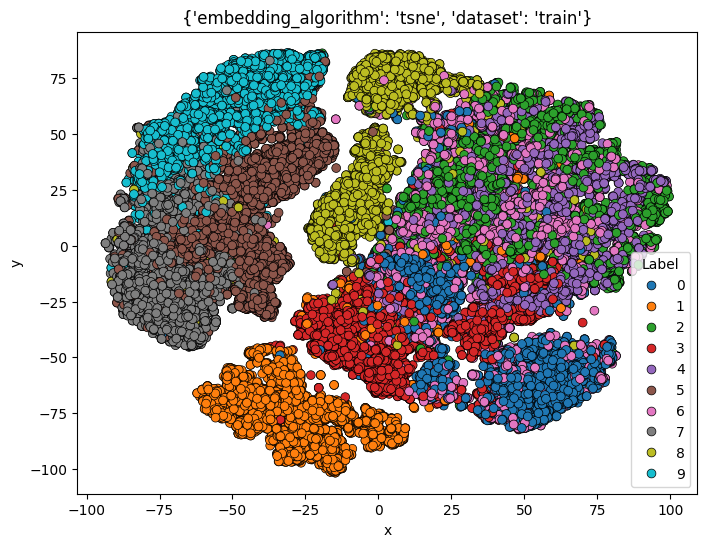

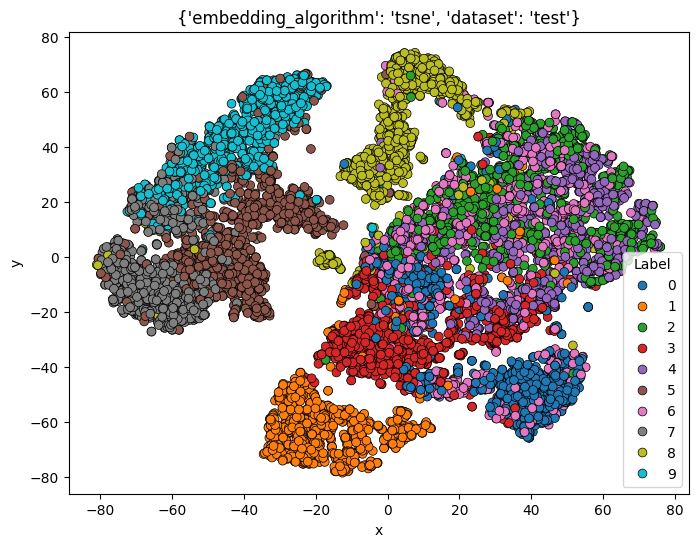

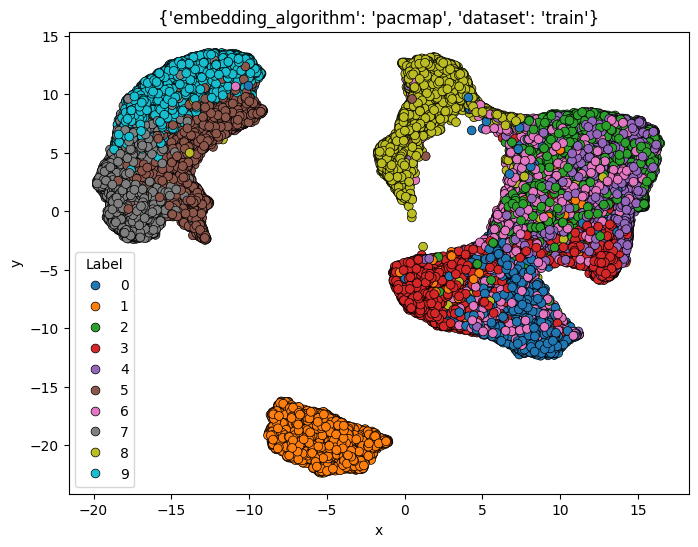

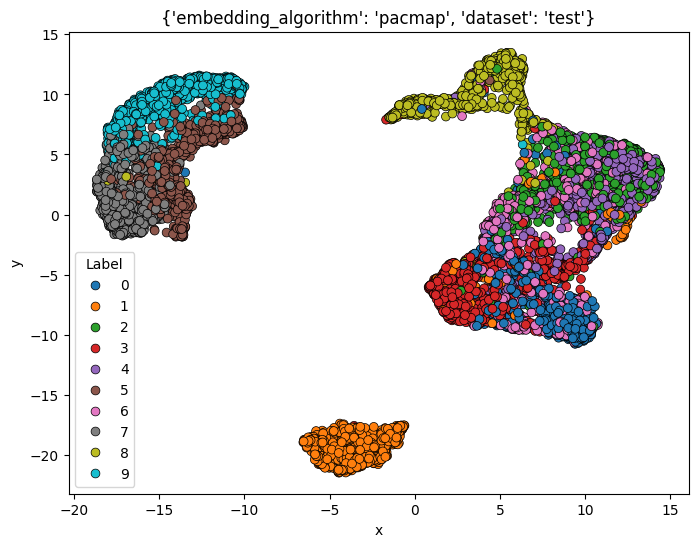

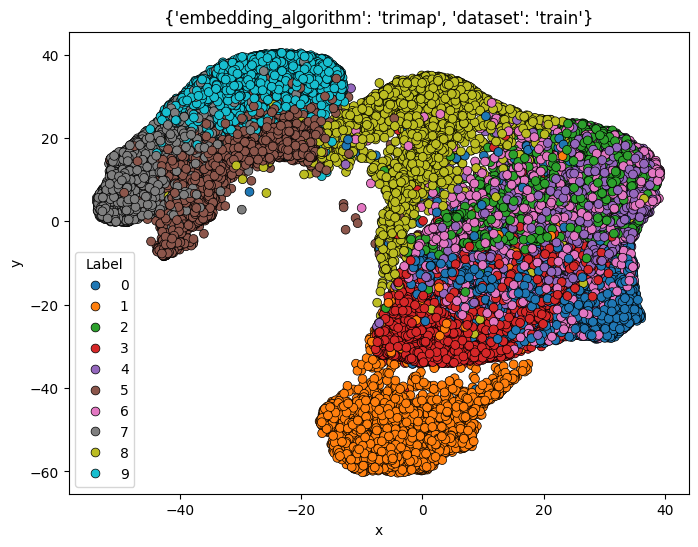

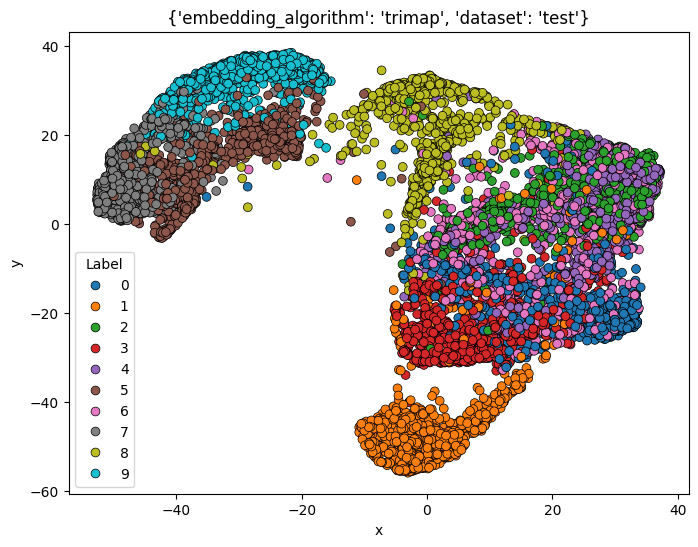

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


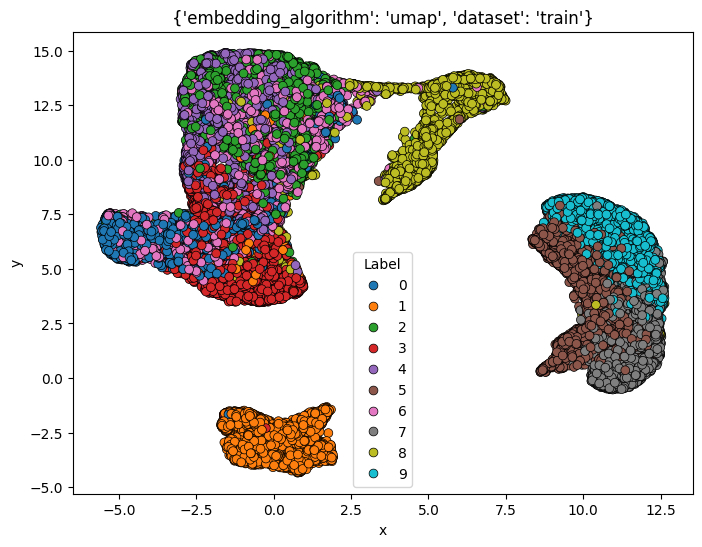

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


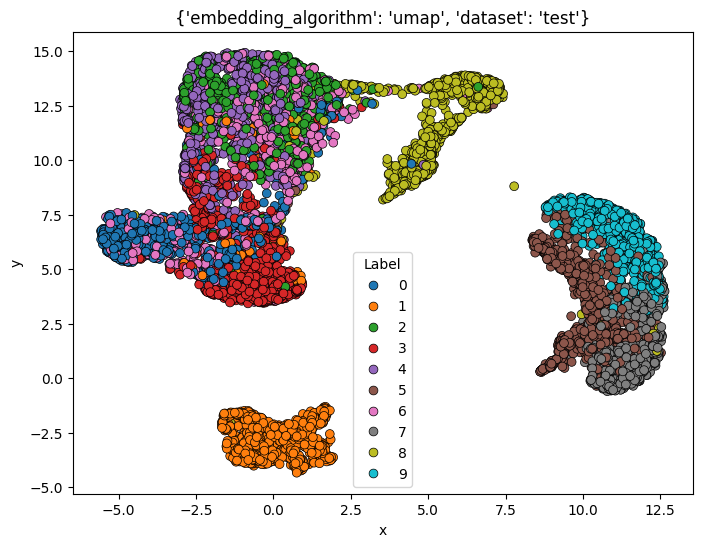

KNN with 3 nearest neighbors
Accuracy: 73.79%

KNN with 5 nearest neighbors
Accuracy: 75.45%

KNN with 10 nearest neighbors
Accuracy: 76.89%



In [27]:
embeddings_algorithms = ["tsne", "pacmap", "trimap", "umap"]

for embedding_algorithm in embeddings_algorithms:
    plot_and_evaluate_embedding(
        train_input.numpy(), 
        train_labels.numpy(), 
        test_input.numpy(), 
        test_labels.numpy(), 
        embedding_algorithm,
        [3, 5, 10]
    )

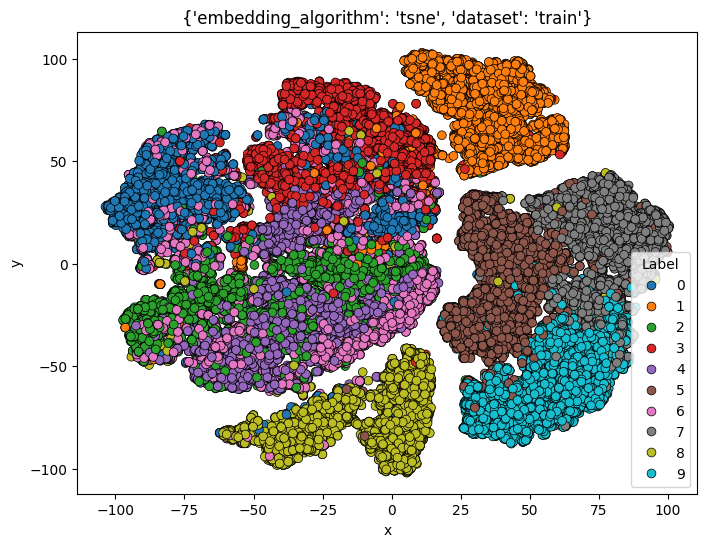

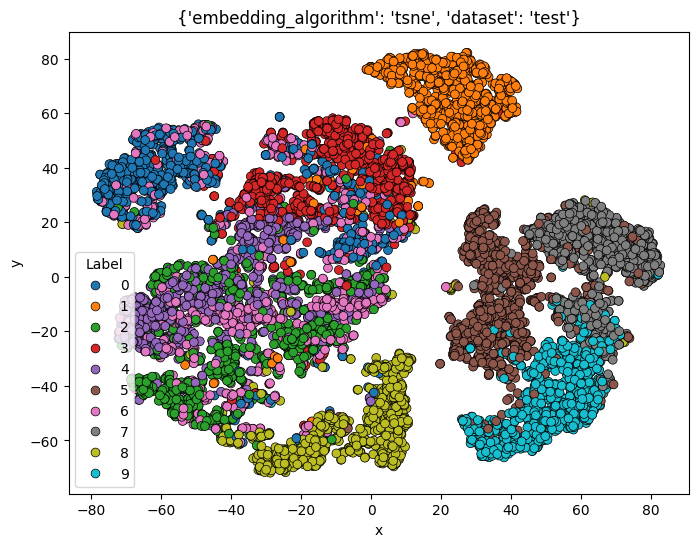

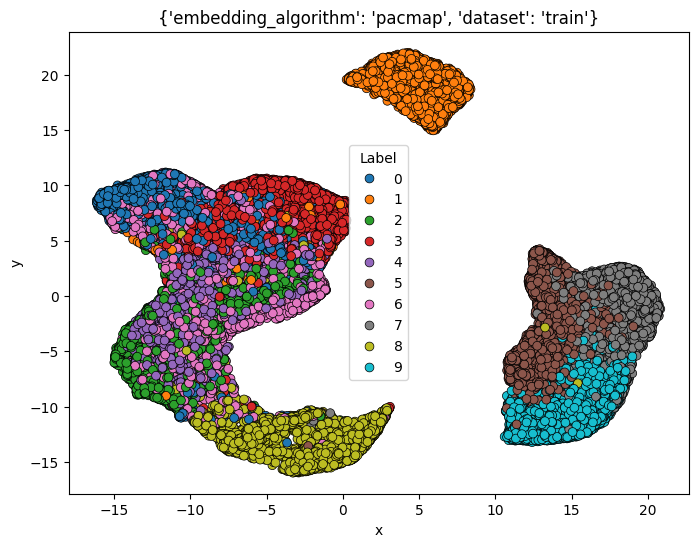

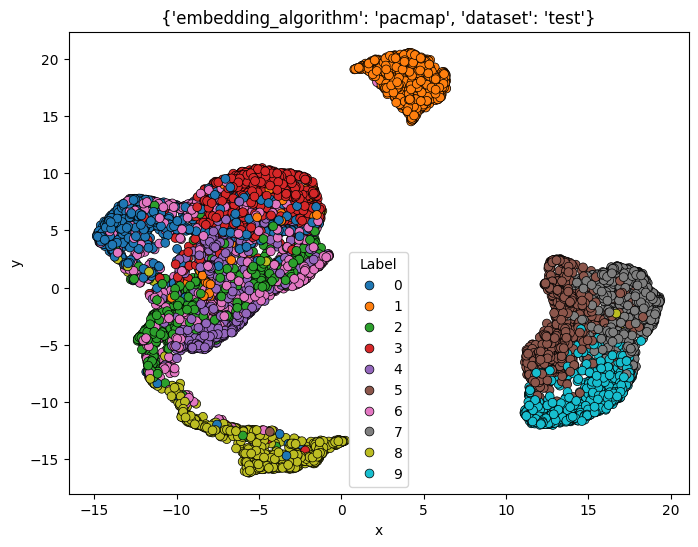

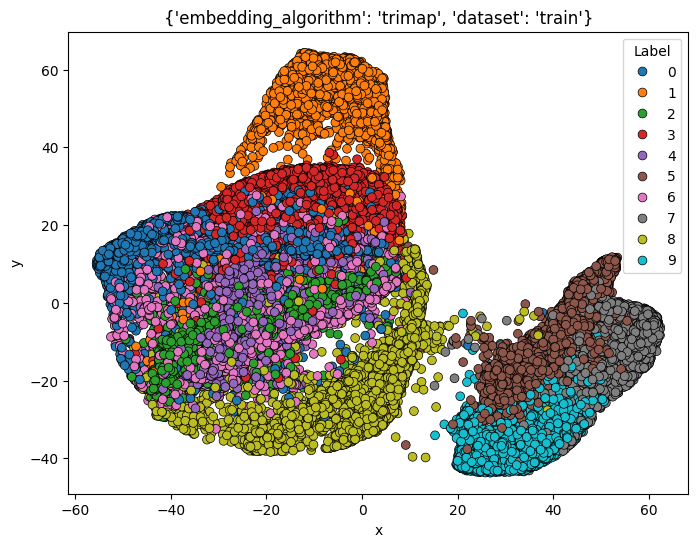

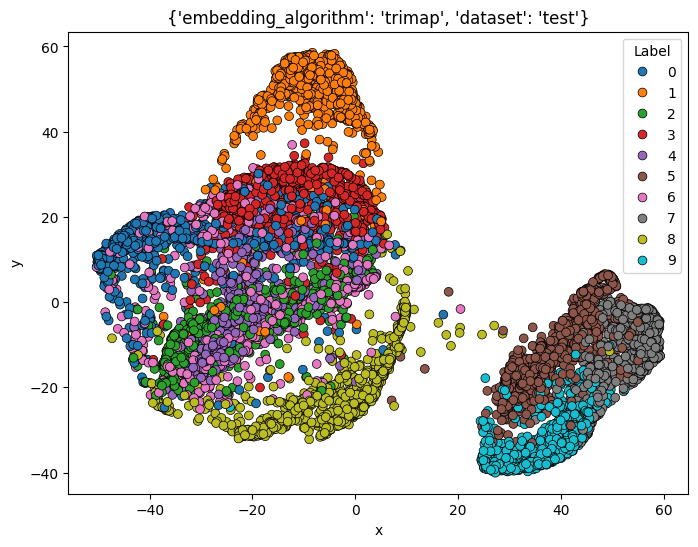

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


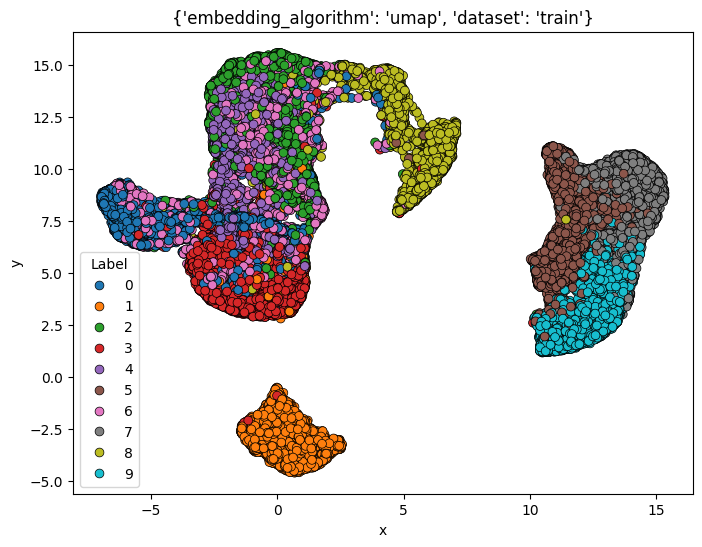

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


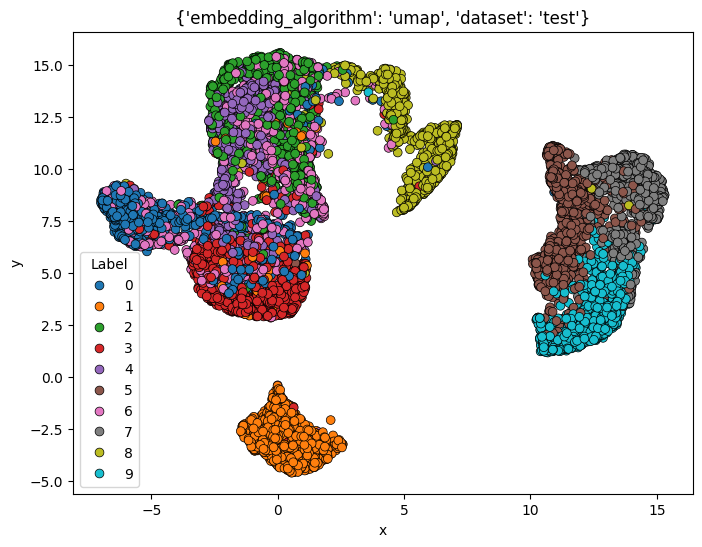

KNN with 3 nearest neighbors
Accuracy: 77.44%

KNN with 5 nearest neighbors
Accuracy: 78.79%

KNN with 10 nearest neighbors
Accuracy: 79.47%



In [28]:
for embedding_algorithm in embeddings_algorithms:
    plot_and_evaluate_embedding(
        train_hidden1.numpy(), 
        train_labels.numpy(), 
        test_hidden1.numpy(), 
        test_labels.numpy(), 
        embedding_algorithm,
        [3, 5, 10]
    )

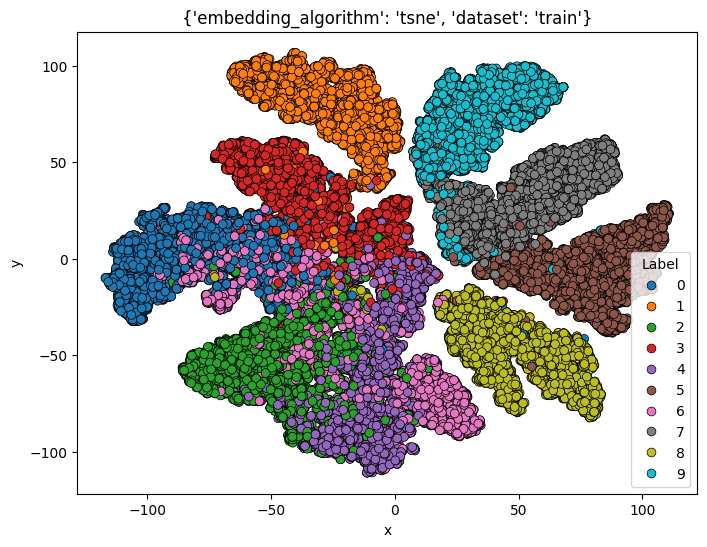

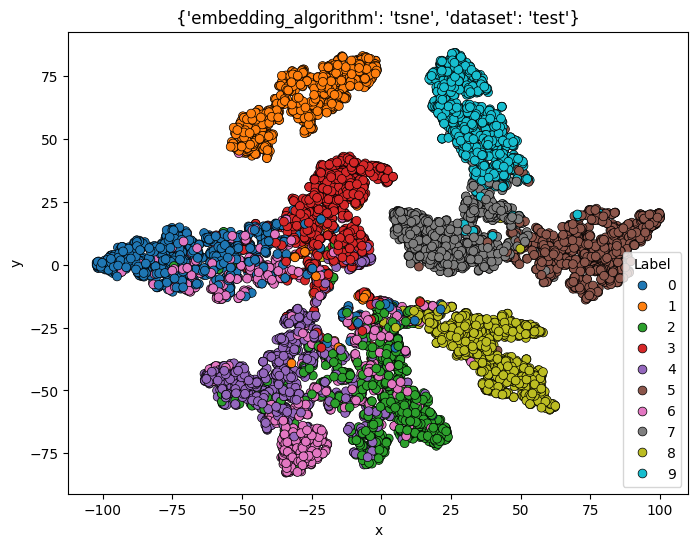

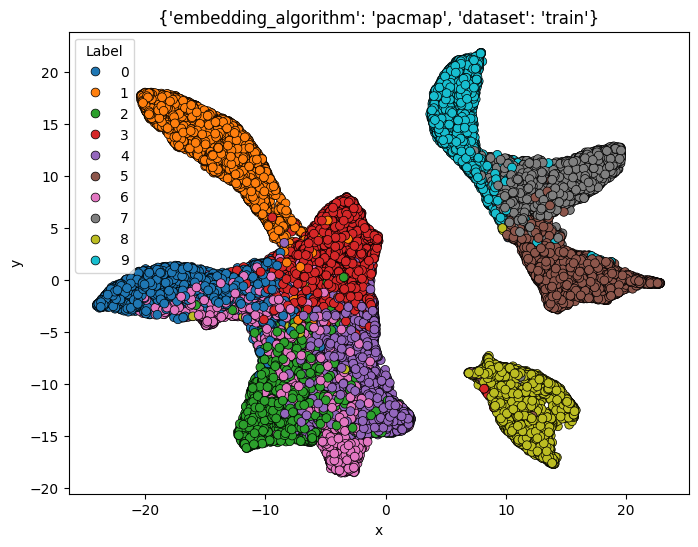

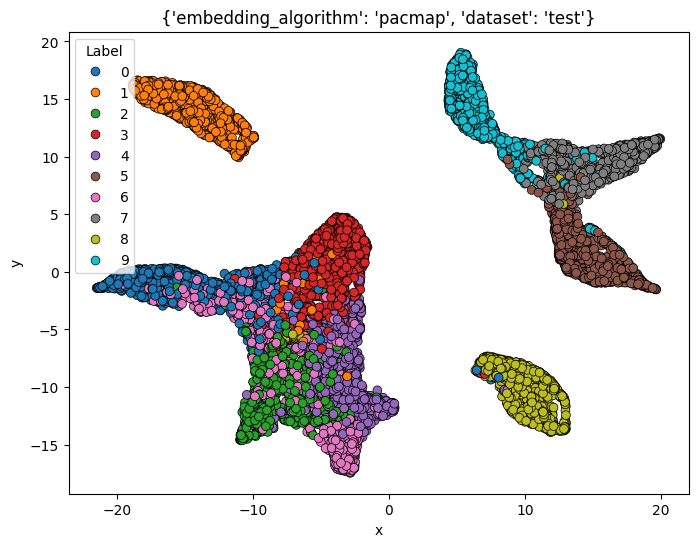

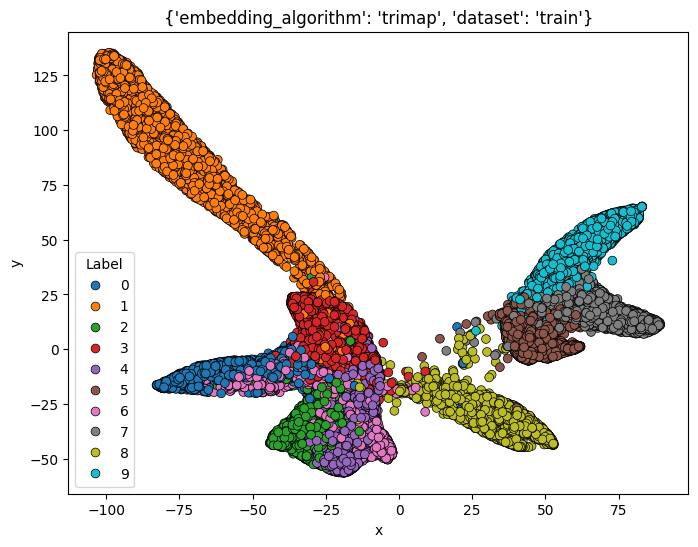

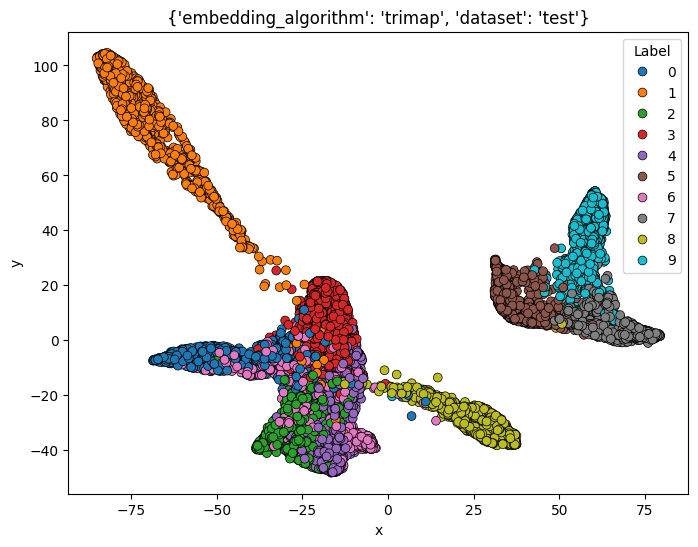

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


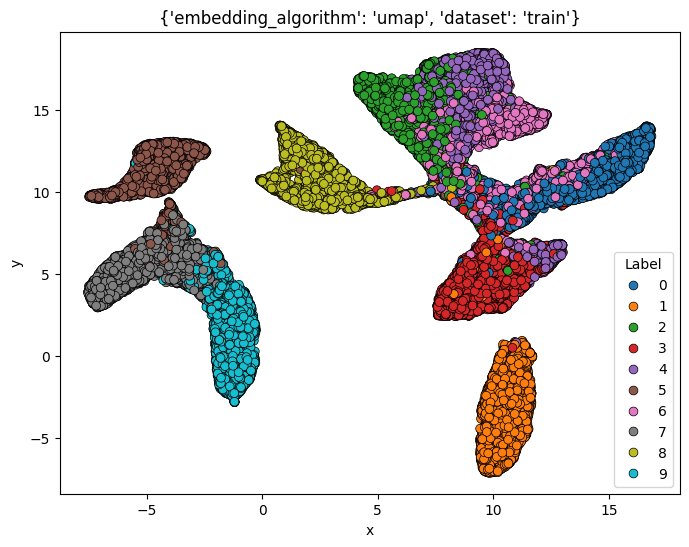

/Users/mnozkiewicz/Magisterka/Wizualizacja/venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


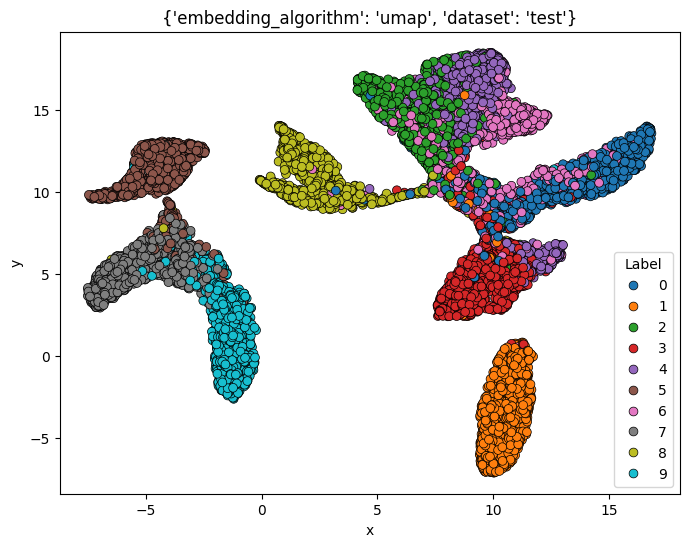

KNN with 3 nearest neighbors
Accuracy: 84.03%

KNN with 5 nearest neighbors
Accuracy: 84.81%

KNN with 10 nearest neighbors
Accuracy: 85.67%



In [29]:
for embedding_algorithm in embeddings_algorithms:
    plot_and_evaluate_embedding(
        train_hidden2.numpy(), 
        train_labels.numpy(), 
        test_hidden2.numpy(), 
        test_labels.numpy(), 
        embedding_algorithm,
        [3, 5, 10]
    )

#### How does the neural network’s representation of fashion items differ from its representation of digits?

The representations for MNIST are much clearer and form more visible cluster. 

#### What might explain any differences in visualization clarity or classification performance between the two datasets?

MNIST is an easier dataset than FashionMNIST, digits have relatively simple and distinct features, while the diffrences between some clothing items from FMNIST are more subtle.

#### Which dimensionality reduction technique works best for Fashion-MNIST, and is this the same as what worked best for MNIST?

For MNIST: All of the algorithms work well.
For Fashion-MNIST: UMAP and T-sne tends to outperform others slightly.

#### How might you modify the neural network architecture to improve visualization or classification for Fashion-MNIST specifically?

We could use any technic that would help train better network, like using a deeper network, using more data for training by utilizing data agumentation.
Since we are dealing with visual data we could also try using Convolutional Neural Networks.